In [1]:
import pandas as pd
import sqlite3

In [2]:
conn = sqlite3.connect('test.db')
df = pd.read_sql('select * from train_position', conn)

In [4]:
import geopandas as gpd
gdf = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df['lon'], df['lat']),
    crs='EPSG:4326'
)

In [14]:
gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

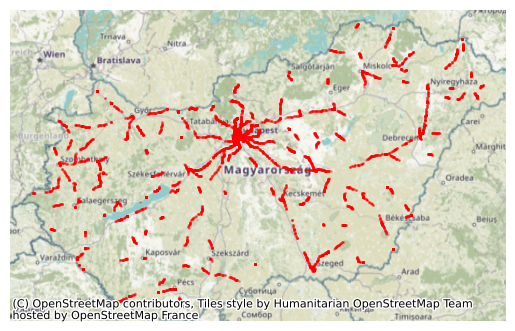

In [22]:
import matplotlib.pyplot as plt
import contextily as ctx


ax = gdf.plot( markersize=1, alpha=0.3, color='red')
ctx.add_basemap(ax, crs=gdf.crs.to_string())


ax.set_axis_off()
plt.show()

In [27]:
import folium
folium.Map(location=[gdf['lat'].mean(), gdf['lon'].mean()], zoom_start=10)
heat_data = [[point.xy[1][0], point.xy[0][0]] for point in gdf.geometry]
heat_map = folium.Map(location=[gdf['lat'].mean(), gdf['lon'].mean()], zoom_start=10)


for point in heat_data:
    folium.CircleMarker(
        location=point,
        radius=1,
        color='red',
        fill=True,
        fill_color='red',
        fill_opacity=0.3,
        popup=folium.Popup('Train Position', parse_html=True)
    ).add_to(heat_map)

heat_map


In [29]:
gdf.geometry

0        POINT (18.00469 47.71675)
1        POINT (17.63494 47.68227)
2        POINT (17.14764 47.91355)
3        POINT (20.21325 47.18732)
4        POINT (19.05405 47.46948)
                   ...            
10047    POINT (19.04427 47.53358)
10048     POINT (19.05459 47.5979)
10049    POINT (19.04881 47.56705)
10050    POINT (19.04723 47.53776)
10051    POINT (19.03948 47.50717)
Name: geometry, Length: 10052, dtype: geometry